# Solar Radiation Prediction

In this project, we'll use the Solar Radiation dataset from the Kaggle repository. This dataset has meteorological data from the HI-SEAS weather station from four months (September through December of 2016) between Mission IV and Mission V.

We will try to build a model of **solar radiation using HI-SEAS weather data**. This data has metrics such as the wind direction, wind speed, humidity, temperature, and so on. Our model should learn from this data and be able to predict the median solar radiation, given all the other metrics.

It is a typical **supervised learning** task since we have labeled training examples (each instance comes with the expected output, i.e., the solar radiation). Moreover, it is also a typical **regression task**, since you are asked to predict a value. More specifically, this is a multivariate regression problem since the system will use multiple features to make a prediction.

# 1. Get Data

## 1.1. Uploading files from your local file system

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

## 1.2. Take a quick look at the data structure

In [42]:
import pandas as pd

data = pd.read_csv('solar.csv')
data.head()

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


The column names are not in a good formatation. So, we need to fix this removing the parenthesis and its content from `WindDirection(Degrees)`, besides to convert the camel case column name to underscore case.

In [43]:
# fixing column names
import re

def camel_to_underscore(name):
    s1 = re.sub('(.)([A-Z][a-z]+)', r'\1_\2', name)
    return re.sub('([a-z0-9])([A-Z])', r'\1_\2', s1).lower()

data.columns = [camel_to_underscore(col.split('(')[0]) for col in data.columns]
data.head()

,unix_time,data,time,radiation,temperature,pressure,humidity,wind_direction,speed,time_sun_rise,time_sun_set
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


Each line is a measurements. There are 11 attributes:
- **unix_time**: unique number identifier.
- **data**: the date of measurement.
- **time**: the time of measurement
- **radiation**: solar radiation in $W/m^2$
- **temperature**: temperature in Fahrenheit
- **pressure**: barometric pressure in Hg
- **humidity**: percentual of humidity
- **wind_direction**: wind direction in degrees
- **speed**: wind speed in miles per hour
- **time_sun_rise**: hour of sunrise in Hawaii time
- **time_sun_set**: hour of sunset in Hawaii time

The `unix_time` is not useful. So, we can drop it.

In [44]:
data.drop('unix_time', axis=1, inplace=True)

Let's get a quick description of the dataset using the info() method

In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32686 entries, 0 to 32685
Data columns (total 10 columns):
data              32686 non-null object
time              32686 non-null object
radiation         32686 non-null float64
temperature       32686 non-null int64
pressure          32686 non-null float64
humidity          32686 non-null int64
wind_direction    32686 non-null float64
speed             32686 non-null float64
time_sun_rise     32686 non-null object
time_sun_set      32686 non-null object
dtypes: float64(4), int64(2), object(4)
memory usage: 2.5+ MB


- There are 32,686 intances in the dataset.
- There are no missing values.
- We have int, float and object types.

In [46]:
data.describe()

,radiation,temperature,pressure,humidity,wind_direction,speed
count,32686.000000,32686.000000,32686.000000,32686.000000,32686.000000,32686.000000
mean,207.124697,51.103255,30.422879,75.016307,143.489821,6.243869
std,315.916387,6.201157,0.054673,25.990219,83.167500,3.490474
min,1.110000,34.000000,30.190000,8.000000,0.090000,0.000000
25%,1.230000,46.000000,30.400000,56.000000,82.227500,3.370000
50%,2.660000,50.000000,30.430000,85.000000,147.700000,5.620000
75%,354.235000,55.000000,30.460000,97.000000,179.310000,7.870000
max,1601.260000,71.000000,30.560000,103.000000,359.950000,40.500000


### 1.2.2. Histogram

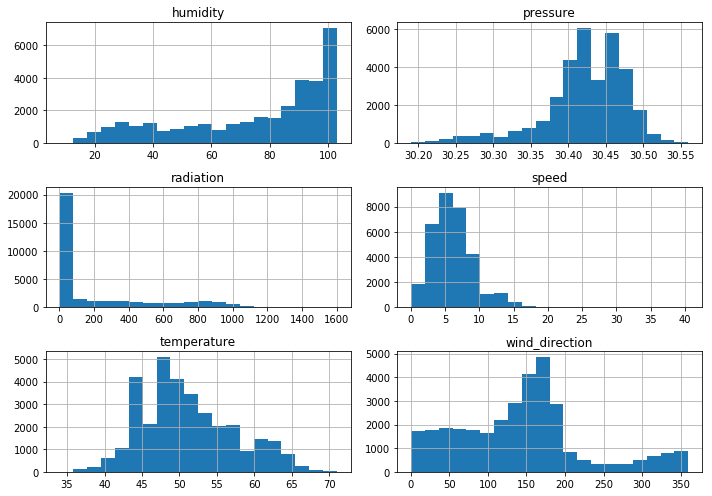

In [47]:
import matplotlib.pyplot as plt
data.hist(bins=20, figsize=(10,7))
plt.tight_layout()
plt.show()

Notice a few things in this histograms:
1. The **humidity** is high in most samples.
2. The **radiation** seems to have some outliers.

### 1.2.3. Create a Test Set

In [48]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(data, 
                                       test_size=0.2, 
                                       random_state=35)

print("data has {} instances\n {} train instances\n {} test intances".
      format(len(data),len(train_set),len(test_set)))


data has 32686 instances
 26148 train instances
 6538 test intances


# 2. Discover and Visualize the Data to Gain Insights

In [49]:
train = train_set.copy()

## 2.1. Looking for Correlations

In [50]:
corr_matrix = train.corr()
corr_matrix['radiation'].\
  sort_values(ascending=False)

radiation         1.000000
temperature       0.736868
pressure          0.122836
speed             0.070317
humidity         -0.224601
wind_direction   -0.229998
Name: radiation, dtype: float64

As we can see, when the radiation value tends to go up, the temperature also goes up, cause they have a correlation coefficient close to 1. The humidity and wind_direction have a small negative correlation with radiation.

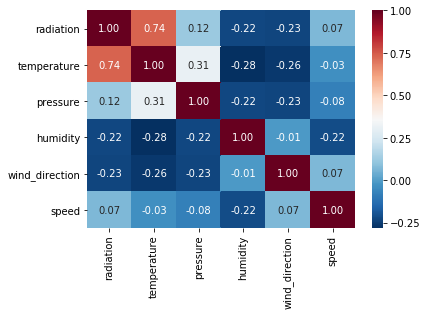

In [51]:
import seaborn as sns
sns.heatmap(train.corr(), annot=True, fmt=".2f", cmap = "RdBu_r")


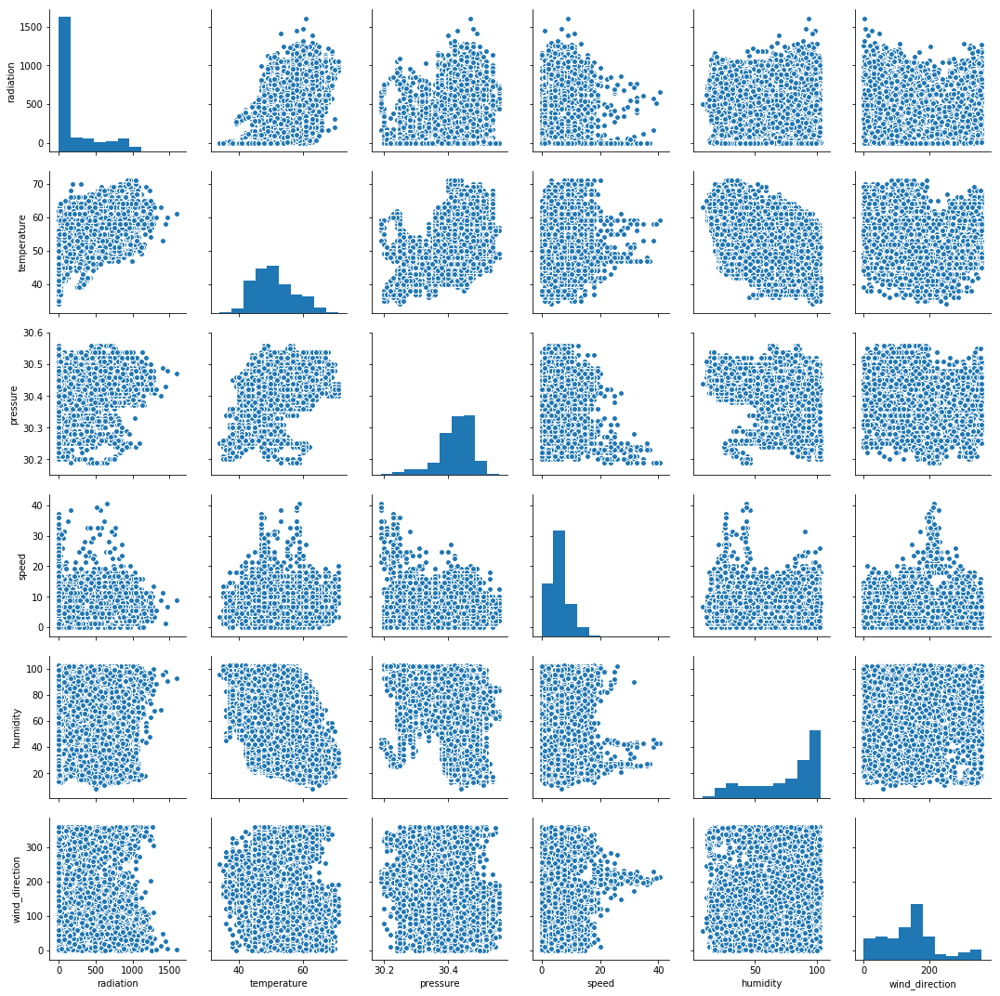

In [52]:
columns = ['radiation', 'temperature', 'pressure', 'speed', 'humidity', 'wind_direction']
sns.pairplot(train[columns], diag_kind='hist')

The most promising attribute to predict the radiation value is the temperature, so let’s zoom in on their correlation scatterplot.

In [53]:
# Cell Configuration for plotly over google colab
# This method pre-populates the outputframe with the configuration that Plotly
# expects and must be executed for every cell which is displaying a Plotly graph.
def configure_plotly_browser_state():
    import IPython
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [54]:
# plotly online requires login and password
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=600,height=400,
                  xaxis=dict(title='Temperature'),
                  yaxis=dict(title='Radiation')) 

# generate a scatter from columns latitude and longitude
trace = [go.Scatter(
    y=train["radiation"], 
    x=train["temperature"],
    mode = 'markers')]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=trace,layout=layout)
pyo.iplot(fig)

# 3. Preparing the Data for Machine Learning Algorithms

In [55]:
train_X = train_set.drop("radiation", axis=1)

train_Y = train_set.radiation.copy()

## 3.1. Data Cleaning

In [56]:
train_X.isnull().sum()

data              0
time              0
temperature       0
pressure          0
humidity          0
wind_direction    0
speed             0
time_sun_rise     0
time_sun_set      0
dtype: int64

The dataset has no missing values and the columns `data`, `time`, `time_sun_rise`, and `time_sun_set` will not be used in the analysis.

In [57]:
train_X.drop(
    ['data', 'time', 'time_sun_rise', 'time_sun_set'],
    axis = 1,
    inplace = True
)

## 3.2. Transformation Pipelines

Let's create a class to handle Pandas datasets and extract only the desired columns.

In [58]:
from sklearn.base import BaseEstimator, TransformerMixin

# This class will transform the data by selecting the desired attributes,
# dropping the rest, and converting the resulting DataFrame to a NumPy array.
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        return X[self.attribute_names].values

Now, we can do a Pipeline with the sequence of transformations for numerical attributes: selection of attributes and standardization.

In [59]:
# Used to join two or more pipelines into a single pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# numerical columns 
num_attribs = list(train_X.columns)

# pipeline for numerical columns
num_pipeline = Pipeline([('selector', DataFrameSelector(num_attribs)),
                         ('std_scaler', StandardScaler())
                        ])

In [60]:
train_X_prepared = num_pipeline.fit_transform(train_X)

# 4. Select and Train a Model

## 4.1. Training and Evaluating on the Training Set

Let's first train a **Linear Regression model.**

In [61]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(train_X_prepared, train_Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [62]:
# prepare the data
some_data = train_X.iloc[:5]
some_labels = train_Y.iloc[:5]
some_data_prepared = num_pipeline.transform(some_data)

# make predictions
print("Predictions:", lin_reg.predict(some_data_prepared)) 

Predictions: [684.1242396  -16.30315044 510.57258718 432.14219585 532.18243499]


In [63]:
# Compare against the actual values:
print("Labels:", list(some_labels))

Labels: [979.16, 1.22, 421.07, 402.45, 721.52]


It works, although the predictions are not exactly accurate. Let's measure this regression model's RMSE on the whole training set.

In [64]:
from sklearn.metrics import mean_squared_error
import numpy as np

radiation_predictions = lin_reg.predict(train_X_prepared)
lin_mse = mean_squared_error(train_Y, radiation_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

207.20619720427368

Most of measurements's radiations range between 1.23 and 354.23 (look the boxplot below), so a typical prediction error of 207,206 is not very satisfying. The model is underfiting the training data.

In [65]:
import numpy as np
import pandas as pd
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# basic functions to run on google colab
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# create a generic layout
layout = go.Layout(width=500,height=400)

# generate a histogram from column median_house_value 
radiation = [go.Box(y=train_Y,
                        name='radiation',
                        boxmean=True)]

# create a figure and plot in notebook. 
# if you wish save the hmtl, change iplot to plot
fig = go.Figure(data=radiation,layout=layout)
pyo.iplot(fig)

So, let's train a **DecisionTreeRegressor**.

In [66]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(train_X_prepared, train_Y)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [67]:
# now that the model is trained, let's evaluate it on the training set

radiation_predictions = tree_reg.predict(some_data_prepared)
tree_mse = mean_squared_error(some_labels, radiation_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

0.0

The error can not be zero. Unfortunately, the model has badly overfit the data. To solve this, we need to use part of the training set for training, and part for model validation.

## 4.2. Cross-Validation

One way to evaluate the Decision Tree model would be to use the cross-validation.

In [68]:
from sklearn.model_selection import cross_val_score


tree_reg = DecisionTreeRegressor()

scores = cross_val_score(tree_reg, 
                         train_X_prepared, 
                         train_Y,
                         scoring="neg_mean_squared_error",
                         cv=10)
rmse_scores = np.sqrt(-scores)
rmse_scores

array([212.65356552, 226.61495064, 214.99489866, 216.4589301 ,
       218.18534276, 229.00985376, 231.16469115, 219.69851439,
       220.83909142, 224.73953345])

In [69]:
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

In [70]:
display_scores(rmse_scores)

Scores: [212.65356552 226.61495064 214.99489866 216.4589301  218.18534276
 229.00985376 231.16469115 219.69851439 220.83909142 224.73953345]
Mean: 221.43593718539006
Standard deviation: 5.891329651569103


Decision Tree does not look as good as it did earlier. It scored approximately 221 ± 5 and seemed to perform worse than the Linear Regression Model. Let's compute this last model again just to be sure:

In [71]:
lin_reg = LinearRegression()

lin_scores = cross_val_score(lin_reg, 
                             train_X_prepared, 
                             train_Y,
                             scoring="neg_mean_squared_error", 
                             cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)
display_scores(lin_rmse_scores)

Scores: [205.89989006 205.9547308  199.27738726 211.98895268 206.37803064
 208.58936359 209.5027887  210.16267364 205.77739544 208.75724155]
Mean: 207.22884543474842
Standard deviation: 3.3176733059853882


That’s right: **the Decision Tree model is overfitting so badly that it performs worse than the Linear Regression model**.

Let's try the **RandomForestRegressor**:

In [72]:
from sklearn.ensemble import RandomForestRegressor

# create a RandomForestRegressor model
forest_reg = RandomForestRegressor()

# fit it
forest_reg.fit(train_X_prepared, train_Y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [73]:
# predict the prepared data
radiation_predictions = forest_reg.predict(train_X_prepared)

forest_mse = mean_squared_error(train_Y, radiation_predictions)
forest_rmse = np.sqrt(forest_mse)
forest_rmse

71.1259294774228

In [74]:
from sklearn.model_selection import cross_val_score

forest_reg = RandomForestRegressor()

forest_scores = cross_val_score(forest_reg,
                                train_X_prepared, 
                                train_Y,
                                scoring="neg_mean_squared_error", 
                                cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)
display_scores(forest_rmse_scores)

Scores: [165.05624379 162.75817052 165.11569503 168.49150704 163.37858235
 175.17432985 174.09176553 163.61042626 168.43012005 170.70663287]
Mean: 167.68134732969864
Standard deviation: 4.247413514169245


This model seems to be very good! But the score in the training set still much lower than on the validation sets. This means that the model is overfitting training set.

# 5. Fine-Tune the Model

To fine-tune the model, we will use the GridSearchCV to find a great combination of hyperparameter valeus.

## 5.1. Grid Search

In [75]:
from sklearn.model_selection import GridSearchCV

# hyperparameters values
# param_grid[0] - 12 combinations
# param_grid[1] - 6 combinations
param_grid = [{'n_estimators': [3, 10, 30], 
               'max_features': [2, 3, 4, 5]
              },
              {'bootstrap': [False], 
               'n_estimators': [3, 10],
               'max_features': [2, 3, 4]
              }
             ]

# create a randomforeestregressor model
forest_reg = RandomForestRegressor()

# run the grid search with cross validation
# (12 + 6) x 5 = 90 combinations
grid_search = GridSearchCV(forest_reg, 
                           param_grid, 
                           cv=5,
                           scoring='neg_mean_squared_error')

# see 90 combinations!!!
# it may take quite a long time
grid_search.fit(train_X_prepared, train_Y)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid=[{'n_estimators': [3, 10, 30], 'max_features': [2, 3, 4, 5]}, {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0)

In [76]:
# when gridsearch is done you can get the best combination of parameters
grid_search.best_params_

{'max_features': 2, 'n_estimators': 30}

In [77]:
# you can also get the best estimator too
grid_search.best_estimator_

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=2, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=30, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [78]:
cvres = grid_search.cv_results_
cvres

/home/gisliany/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True

/home/gisliany/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True

/home/gisliany/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True

/home/gisliany/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:122: FutureWarning:

You are accessing a training score ('split3_t

{'mean_fit_time': array([0.07108355, 0.23681931, 0.7552928 , 0.09695477, 0.3257915 ,
        0.93870435, 0.12081704, 0.39510612, 1.2250062 , 0.14705162,
        0.48072557, 1.46349235, 0.10921879, 0.38121815, 0.15659909,
        0.49885712, 0.19325151, 0.63029327]),
 'std_fit_time': array([0.00672831, 0.00952212, 0.0303991 , 0.00609471, 0.02367252,
        0.00554419, 0.00111885, 0.00341719, 0.03370283, 0.00321254,
        0.00285943, 0.02264715, 0.0060881 , 0.02974075, 0.00975575,
        0.0055067 , 0.00662282, 0.0082518 ]),
 'mean_score_time': array([0.00409503, 0.01325641, 0.04170313, 0.00446219, 0.01241436,
        0.03612227, 0.00405321, 0.01237307, 0.03618021, 0.00405583,
        0.0127707 , 0.03787913, 0.0046833 , 0.01500292, 0.00530591,
        0.01421914, 0.00493302, 0.0143189 ]),
 'std_score_time': array([2.07996095e-04, 1.61752834e-03, 3.96128016e-03, 8.17139512e-04,
        1.80911389e-04, 2.80203058e-04, 1.86915300e-05, 1.48276545e-04,
        2.81167765e-04, 6.17898167e-

In [79]:
# a fancy visualization of results
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    print(np.sqrt(-mean_score), params)

187.01055204294832 {'max_features': 2, 'n_estimators': 3}
166.75446782879044 {'max_features': 2, 'n_estimators': 10}
161.52615048845456 {'max_features': 2, 'n_estimators': 30}
184.96431483542048 {'max_features': 3, 'n_estimators': 3}
167.6189827820152 {'max_features': 3, 'n_estimators': 10}
162.0894033942494 {'max_features': 3, 'n_estimators': 30}
185.83388067284037 {'max_features': 4, 'n_estimators': 3}
167.82346233332242 {'max_features': 4, 'n_estimators': 10}
161.95666067698104 {'max_features': 4, 'n_estimators': 30}
186.56517675483337 {'max_features': 5, 'n_estimators': 3}
168.35292993478078 {'max_features': 5, 'n_estimators': 10}
162.6852974596417 {'max_features': 5, 'n_estimators': 30}
185.49880218787231 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
167.52136781007405 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
184.84304463989662 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}
170.63469156745708 {'bootstrap': False, 'max_features': 3, 'n_es

In this example, we obtain the best solution by setting:
- the **max_features** hyperparameter to **2**
- and the **n_estimators** hyperparameter to **30**. 

The RMSE score for this combination is 161.526, which is better than the score we got earlier using the default hyperparameter values (which was 167.681).

## 5.2. Analyze the Best Models and Their Errors

In [80]:
# can indicate the relative importance of each attribute 
# for making accurate predictions
feature_importances = grid_search.best_estimator_.feature_importances_
feature_importances

array([0.47931789, 0.06979351, 0.15013664, 0.23578512, 0.06496684])

In [81]:
sorted(zip(feature_importances, train_X.columns), reverse=True)

[(0.47931788803011804, 'temperature'),
 (0.23578511900630475, 'wind_direction'),
 (0.15013663537578742, 'humidity'),
 (0.06979351425189699, 'pressure'),
 (0.0649668433358927, 'speed')]

With this information, we can drop some of the less useful features.

# 6. Final Model

Now is the time to evaluate the final model on the test set.

In [82]:
# best model found in gridsearch step
final_model = grid_search.best_estimator_

# predictors and label
test_X = test_set.drop("radiation", axis=1)
test_y = test_set["radiation"].copy()

# prepared test's predictors
test_X_prepared = num_pipeline.transform(test_X)


final_predictions = final_model.predict(test_X_prepared)
final_mse = mean_squared_error(test_y, final_predictions)
final_rmse = np.sqrt(final_mse)
print(final_rmse)

162.60799382777367
